### Working with geographical data using DataFrames.jl


Minisimposium for tabular data, creation of this tutorial has been supported by the Polish National Agency for Academic Exchange under the Strategic Partnerships programme, grant number BPI/PST/2021/1/00069/U/00001

In [55]:
using OSMToolset  # Pkg.add(url="https://github.com/pszufe/OSMToolset.jl", rev="main")
using DataFrames
using PyCall
using OpenStreetMapX
using Colors
using Plots
using SimpleValueGraphs
using OpenStreetMapXPlot

flm = pyimport("folium");

The boston.osm file was downloaded form [https://overpass-api.de/api/map?bbox=-71.1098,42.3521,-71.0502,42.3805](https://overpass-api.de/api/map?bbox=-71.1098,42.3521,-71.0502,42.3805)

You can used a smaller inbuilt `map.osm` file instead too (uncomment code)

In [50]:
#file = joinpath(dirname(pathof(OSMToolset)),"..","test","data","map.osm")
map_data = get_map_data(file, use_cache=false, trim_to_connected_graph=true ); 

Attractiveness Spatial Index (ix) is built on the base of a DataFrame. Attractiveness of a location is evaluated by providing its coordinates. 

In [51]:
using CSV
CSV.read(OSMToolset.__builtin_attract_path, DataFrame )

Row,class,key,points,range,values
,String15,String31,Int64,Int64,String
1,education,amenity,3,2000,kindergarten
2,education,amenity,5,3000,"school,music_school,language_school"
3,education,amenity,20,10000,"university,college"
4,education,amenity,5,1000,library
5,restaurants,amenity,5,750,"restaurant,fast_food"
6,restaurants,amenity,15,1000,food_court
7,entertainment,amenity,5,750,"pub,bar"
8,restaurants,amenity,5,750,"cafe,ice_cream"
9,shopping,amenity,1,750,"bank,atm"


In [52]:
file = joinpath(dirname(pathof(OSMToolset)),"..","boston.osm")
tt = @elapsed df = find_poi(file)  # ; attract_config::AttractivenessConfig=__builtin_attract
println("OSM file parsing speed: $(round(filesize(file)/(1024*1024)/tt,digits=1)) MB/s") 


OSM file parsing speed: 12.1 MB/s


In [54]:
df # list of POIs in central Boston

Row,elemtype,elemid,nodeid,lat,lon,key,value,class,points,range
,Symbol,Int64,Int64,Float64,Float64,String,String,String,Int64,Int64
1,node,69480814,69480814,42.357,-71.0588,public_transport,stop_position,transport,5,300
2,node,69482188,69482188,42.3599,-71.06,public_transport,stop_position,transport,5,300
3,node,69482993,69482993,42.3525,-71.0549,public_transport,stop_position,transport,5,300
4,node,69487423,69487423,42.3736,-71.0697,railway,station,transport,10,700
5,node,69487440,69487440,42.3654,-71.1037,public_transport,stop_position,transport,5,300
6,node,69488191,69488191,42.3612,-71.0713,public_transport,stop_position,transport,5,300
7,node,69488839,69488839,42.3568,-71.0633,public_transport,stop_position,transport,5,300
8,node,69490284,69490284,42.3652,-71.0603,public_transport,stop_position,transport,5,300
9,node,69490954,69490954,42.3518,-71.0627,public_transport,stop_position,transport,5,300


In [34]:
ix = AttractivenessSpatIndex(df);

# Stata Center campus
lat=42.361732327506516
lon=-71.09043164955334

attract = attractiveness(ix, lat, lon)


(education = 364.07988461350504, parking = 1.0575223826966949, shopping = 16.62025527806438, transport = 7.1895280000006405, healthcare = 3.477632654568438, entertainment = 47.89522092353563, leisure = 290.5967600088863, restaurants = 113.55682405754388)

explain=true makes it possible to understand how the value was built

In [23]:
attract = attractiveness(ix, lat, lon, explain=true)
attract[2]

Row,class,points,poidistance,lat,lon
,Symbol,Int64,Float64,Float64,Float64
1,education,20,1152.68,42.3518,-71.0864
2,education,5,1268.2,42.3522,-71.082
3,education,20,2297.67,42.3522,-71.0657
4,leisure,5,1063.19,42.3531,-71.0849
5,leisure,5,1067.76,42.3531,-71.0846
6,education,20,1725.15,42.3533,-71.108
7,education,5,1427.18,42.3535,-71.0771
8,education,20,2475.85,42.3538,-71.0623
9,leisure,5,1450.25,42.3543,-71.1049


In [24]:
ix.df

Row,elemtype,elemid,nodeid,lat,lon,key,value,class,points,range
,Symbol,Int64,Int64,Float64,Float64,String,String,String,Int64,Int64
1,node,69480814,69480814,42.357,-71.0588,public_transport,stop_position,transport,5,300
2,node,69482188,69482188,42.3599,-71.06,public_transport,stop_position,transport,5,300
3,node,69482993,69482993,42.3525,-71.0549,public_transport,stop_position,transport,5,300
4,node,69487423,69487423,42.3736,-71.0697,railway,station,transport,10,700
5,node,69487440,69487440,42.3654,-71.1037,public_transport,stop_position,transport,5,300
6,node,69488191,69488191,42.3612,-71.0713,public_transport,stop_position,transport,5,300
7,node,69488839,69488839,42.3568,-71.0633,public_transport,stop_position,transport,5,300
8,node,69490284,69490284,42.3652,-71.0603,public_transport,stop_position,transport,5,300
9,node,69490954,69490954,42.3518,-71.0627,public_transport,stop_position,transport,5,300


In [35]:
df = deepcopy(ix.df)
vals = ENU.(LLA.(df.lat, df.lon),Ref(map_data.bounds) )  #Ref(ix.refLLA)
df.x .= getfield.(vals, :east)
df.y .= getfield.(vals, :north)
df

Row,elemtype,elemid,nodeid,lat,lon,key,value,class,points,range,x,y
,Symbol,Int64,Int64,Float64,Float64,String,String,String,Int64,Int64,Float64,Float64
1,node,69480814,69480814,42.357,-71.0588,public_transport,stop_position,transport,5,300,1746.64,-1035.44
2,node,69482188,69482188,42.3599,-71.06,public_transport,stop_position,transport,5,300,1647.18,-710.309
3,node,69482993,69482993,42.3525,-71.0549,public_transport,stop_position,transport,5,300,2066.0,-1529.94
4,node,69487423,69487423,42.3736,-71.0697,railway,station,transport,10,700,846.854,813.538
5,node,69487440,69487440,42.3654,-71.1037,public_transport,stop_position,transport,5,300,-1955.96,-100.232
6,node,69488191,69488191,42.3612,-71.0713,public_transport,stop_position,transport,5,300,713.655,-567.151
7,node,69488839,69488839,42.3568,-71.0633,public_transport,stop_position,transport,5,300,1378.13,-1056.26
8,node,69490284,69490284,42.3652,-71.0603,public_transport,stop_position,transport,5,300,1619.06,-125.945
9,node,69490954,69490954,42.3518,-71.0627,public_transport,stop_position,transport,5,300,1423.73,-1610.27


In [36]:
colrs = distinguishable_colors(length(ix.measures), [RGB(0.1,0.2,0.4)])
class2col =  Dict(ix.measures .=> colrs)
colrs


In [37]:
m = flm.Map(tiles = "Stamen Toner")

line =0


function latlon(m::MapData,map_g_point_id::Int64)
    osm_node_ix = m.n[map_g_point_id]
    lla = LLA(m.nodes[osm_node_ix], m.bounds)
    return (lla.lat, lla.lon)
end

for e in SimpleValueGraphs.edges(map_data.g)
    # println(e)
    flm.PolyLine(     (latlon(map_data,e.src), latlon(map_data,e.dst)),
        color="#a4f3a7", weight=2, 
        opacity=0.8).add_to(m)
end

for row in eachrow(df) 
    line += 1
    info = "$(row.class):$(row.key)=$(row.value)"
    
    k = findfirst(==(Symbol(row.class)), ix.measures)
    flm.Circle((row.lat, row.lon), color="#$(hex(colrs[k]))",radius=row.points,
        fill_color="#$(hex(colrs[k]))", fill_opacity=0.06, tooltip=info).add_to(m)
    
end
m.fit_bounds([(minimum(df.lat), minimum(df.lon)), (maximum(df.lat), maximum(df.lon))])
MAP_BOUNDS = [(map_data.bounds.min_y,map_data.bounds.min_x),(map_data.bounds.max_y,map_data.bounds.max_x)]
flm.Rectangle(MAP_BOUNDS, color="blue",weight=2).add_to(m)

m.fit_bounds(MAP_BOUNDS)
m

PyObject <folium.folium.Map object at 0x0000019926DFBDF0>

In [28]:
ix.measures

8-element Vector{Symbol}:
 :education
 :entertainment
 :healthcare
 :leisure
 :parking
 :restaurants
 :shopping
 :transport

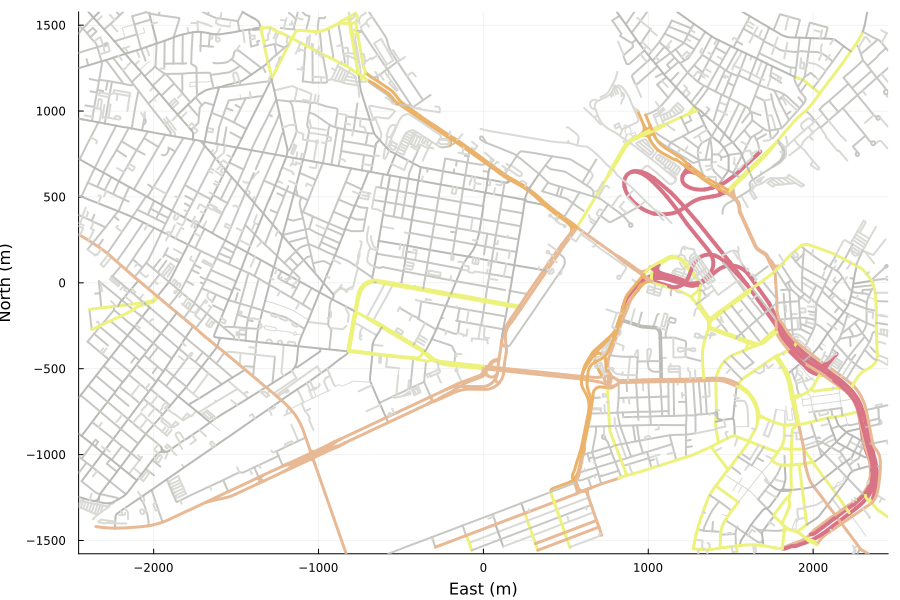

In [29]:
p = plotmap(map_data; width=900, height=600)

In [30]:
using StatsBase


cellsize = 100  # meters
xwidth = maximum(df.x)-minimum(df.x)
ywidth = maximum(df.y)-minimum(df.y)
nrow = round(Int, ywidth / cellsize)
ncol = round(Int, xwidth / cellsize)
#data = Array{Float64}(undef, length(ix.measures),  nrow, ncol);

xmin = minimum(df.x)
ymin = minimum(df.y)

attdf = DataFrame()

for i in 1:nrow
    for j in 1:ncol
        x = xmin + cellsize*(j - 0.5)
        y = ymin + cellsize*(i - 0.5)
        enu = ENU(x,y) # ENU in mapdata coordinates
        lla = LLA(enu, map_data.bounds)
        enu2 = ENU(lla, ix.refLLA) #ENU in sptatial indec coordinates
        att = attractiveness(ix, enu2, +)
        for measu in ix.measures 
            a = att[measu]
            push!(attdf,(;measu, x,y,a))
        end
    end
end

attdf

Row,measu,x,y,a
,Symbol,Float64,Float64,Float64
1,education,-4545.5,-3980.21,138.46
2,entertainment,-4545.5,-3980.21,0.0
3,healthcare,-4545.5,-3980.21,0.0
4,leisure,-4545.5,-3980.21,0.0
5,parking,-4545.5,-3980.21,0.0
6,restaurants,-4545.5,-3980.21,0.0
7,shopping,-4545.5,-3980.21,0.0
8,transport,-4545.5,-3980.21,0.0
9,education,-4445.5,-3980.21,141.379


In [31]:
scale(col::RGB{Float64}, perc) = RGB(col.r+(1-col.r)*(1-perc), col.g+(1-col.g)*(1-perc), col.b+(1-col.b)*(1-perc))

scale (generic function with 1 method)

In [39]:
string(ix.measures)

"[:education, :entertainment, :healthcare, :leisure, :parking, :restaurants, :shopping, :transport]"

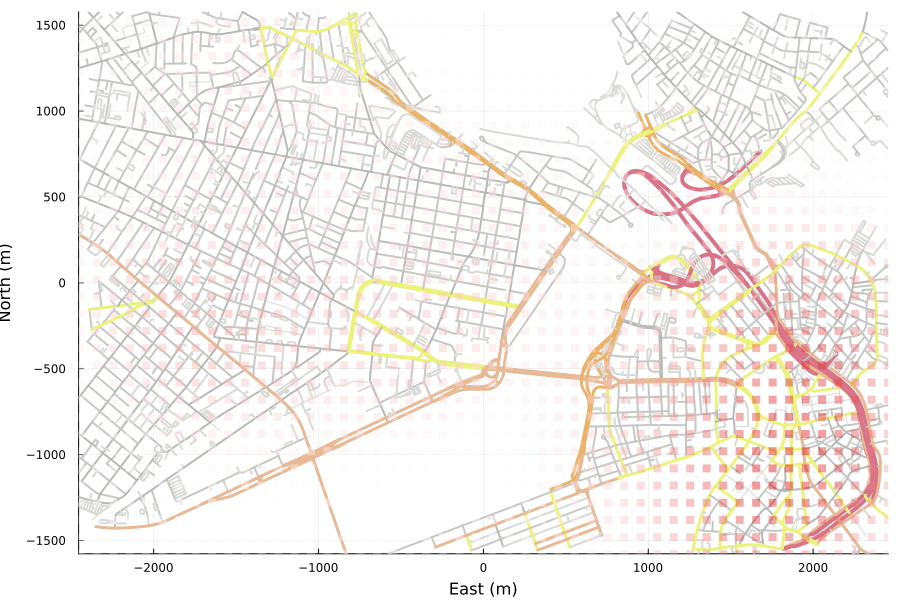

In [46]:
p2 = deepcopy(p)

poiclass = :restaurants

points = attdf[attdf.measu .== poiclass, :]
points.z .=  points.a ./ maximum(points.a)
scatter!(p2, points.x, points.y;fillalpha=0.5,markershape=:rect, markeralpha=0.42,markerstrokewidth=0, markercolor=scale.(Ref(class2col[poiclass]), points.z))

p2